# Data preparation for Nanostring

In [3]:
import scanpy as sc
import squidpy as sq
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import anndata as ad
import seaborn as sns
from pathlib import Path

%load_ext autoreload
%autoreload 2
%load_ext lab_black

sc.logging.print_header()

/opt/homebrew/Caskroom/miniforge/base/envs/squidpy_3_9/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.6 scipy==1.8.0 pandas==1.4.2 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.9 pynndescent==0.5.6


## Download the data, unpack and load to anndata

Download the data from [Nanostring FFPE Dataset](https://nanostring.com/products/cosmx-spatial-molecular-imager/ffpe-dataset/). Unpack the `.tar.gz` file.
Load the unpacked dataset into an [`anndata.AnnData`](https://anndata.readthedocs.io/en/latest/generated/anndata.AnnData.html) object. The dataset used here consists of a non-small-cell lung cancer (NSCLC) tissue which represents the largest single-cell and subcellular analysis on Formalin-Fixed Paraffin-Embedded (FFPE) samples.

In [ ]:
# !mkdir tutorial_data
# !mkdir tutorial_data/nanostring_data
# !wget -P tutorial_data/nanostring_data https://nanostring-public-share.s3.us-west-2.amazonaws.com/SMI-Compressed/Lung5_Rep2/Lung5_Rep2+SMI+Flat+data.tar.gz
# !tar -xzf tutorial_data/nanostring_data/Lung5_Rep2+SMI+Flat+data.tar.gz -C tutorial_data/nanostring_data/.

In [ ]:
nanostring_dir = Path(".") / "tutorial_data" / "nanostring_data"


sample_dir = nanostring_dir / "Lung5_Rep2" / "Lung5_Rep2-Flat_files_and_images"


adata = sq.read.nanostring(
    path=sample_dir,
    counts_file="Lung5_Rep2_exprMat_file.csv",
    meta_file="Lung5_Rep2_metadata_file.csv",
    fov_file="Lung5_Rep2_fov_positions_file.csv",
)
adata.uns["spatial"].keys()

## Make the variable names unique, filter the mitochondrial genes

Make the variable names unique using the method [`anndata.var_names_make_unique`](https://anndata.readthedocs.io/en/refpaths/anndata.AnnData.var_names_make_unique.html).
Obtain the mitochondrial genes using their names prefixed with "mt-".
Calculate the quality control metrics on the [`anndata.AnnData`](https://anndata.readthedocs.io/en/latest/generated/anndata.AnnData.html) using [`scanpy.pp.calculate_qc_metrics`](https://scanpy.readthedocs.io/en/stable/generated/scanpy.pp.calculate_qc_metrics.html).

In [5]:
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

## Calculate quality control metrics

Plot the "total_counts" and "n_genes_by_counts" from [`anndata.obs`](https://anndata.readthedocs.io/en/refpaths/anndata.AnnData.obs.html).
The first subplot shows `adata.obs["total_counts"]`, the second `adata.obs["total_counts"]` less than 10000.
The third subplot displays `adata.obs["n_genes_by_counts"]` while the fourth displays the `adata.obs["n_genes_by_counts"]` less than 4000.

/opt/homebrew/Caskroom/miniforge/base/envs/squidpy_3_9/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='n_genes_by_counts'>

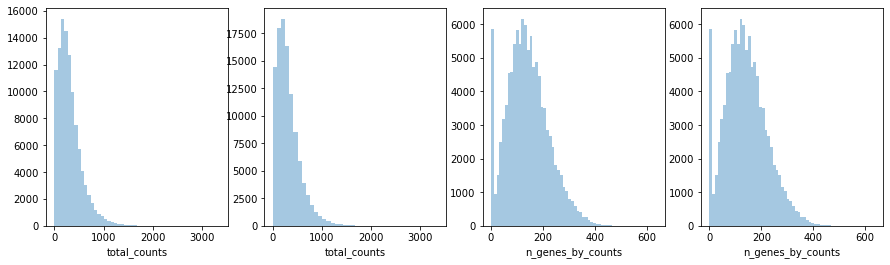

In [6]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.distplot(
    adata.obs["total_counts"],
    kde=False,
    ax=axs[0],
)
sns.distplot(
    adata.obs["total_counts"][adata.obs["total_counts"] < 10000],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.distplot(
    adata.obs["n_genes_by_counts"],
    kde=False,
    bins=60,
    ax=axs[2],
)
sns.distplot(
    adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000],
    kde=False,
    bins=60,
    ax=axs[3],
)

Filter the cells based on the minimum number of counts required using [`scanpy.pp.filter_cells`](https://scanpy.readthedocs.io/en/stable/generated/scanpy.pp.filter_cells.html). Filter the genes based on the minimum number of cells required with [`scanpy.pp.filter_genes`](https://scanpy.readthedocs.io/en/stable/generated/scanpy.pp.filter_genes.html). The parameters for the both were specified based on the plots above. They were set to filter out nearly 10% of the cells and genes with minimum counts and minimum cells respectively.

In [7]:
sc.pp.filter_cells(adata, min_counts=100)
sc.pp.filter_genes(adata, min_cells=400)

## Annotate the genes, normalize counts per cell

Annotate the highly variable genes based on the count data by using [`scanpy.pp.highly_variable_genes`](https://scanpy.readthedocs.io/en/stable/generated/scanpy.pp.highly_variable_genes.html) with `flavor="seurat_v3"`. Normalize counts per cell using [`scanpy.pp.normalize_total`](https://scanpy.readthedocs.io/en/stable/generated/scanpy.pp.normalize_total.html).

Logarithmize, do principal component analysis, compute a neighborhood graph of the observations using [`scanpy.pp.log1p`](https://scanpy.readthedocs.io/en/stable/generated/scanpy.pp.log1p.html), [`scanpy.pp.pca`](https://scanpy.readthedocs.io/en/stable/generated/scanpy.pp.pca.html) and [`scanpy.pp.neighbors`](https://scanpy.readthedocs.io/en/stable/generated/scanpy.pp.neighbors.html) respectively.

Use [`scanpy.tl.umap`](https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.umap.html) to embed the neighborhood graph of the data and cluster the cells into subgroups employing [`scanpy.tl.leiden`](https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.leiden.html).

Install `scikit-misc` package as it is used for Seurat_v3, a toolkit for single cell genomics. This is used to identify the highly variable genes.

In [8]:
!pip install scikit-misc

In [9]:
adata.layers["counts"] = adata.X.copy()
sc.pp.highly_variable_genes(adata, flavor="seurat_v3", n_top_genes=4000)
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata)

## Plot UMAP and rank genes

Subplot with scatter plot in UMAP (Uniform Manifold Approximation and Projection) basis. The spatial relations of the data were represented by the embedded points. These embedded points were colored, respectively, according to the total counts, number of genes by counts, leiden clusters and fields of view in each of the subplots. This gives us some idea of what the data looks like.

In this case, the fields of view which are the technical batches blends well with the UMAP, which implies that the batch effect is potentially low. If otherwise, this can be amended with the batch effect correction methods.

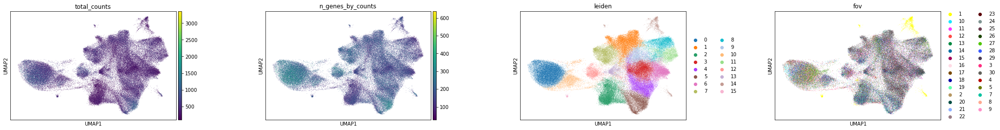

In [10]:
sc.pl.umap(
    adata, color=["total_counts", "n_genes_by_counts", "leiden", "fov"], wspace=0.4
)

Rank the genes for characterizing groups with [`scanpy.tl.rank_genes_groups`](https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.rank_genes_groups.html), based on the Leiden clusters. This returns the [`anndata.AnnData`](https://anndata.readthedocs.io/en/latest/generated/anndata.AnnData.html) object with `anndata.uns["rank_genes_groups"]` with `['logfoldchanges', 'names', 'params', 'pvals', 'pvals_adj', 'scores']` as keys.

In [11]:
sc.tl.rank_genes_groups(adata, groupby="leiden")
adata.uns["rank_genes_groups"].keys()

dict_keys(['params', 'names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges'])

Plot the ranking of the genes from above using [`scanpy.pl.rank_genes_groups`](https://scanpy.readthedocs.io/en/stable/generated/scanpy.pl.rank_genes_groups.html#scanpy.pl.rank_genes_groups). Each of the subplots represents the gene ranking for each Leiden clustered group. Top 20 genes are plotted by default. This can be changed by specifying the parameter `n_genes`.

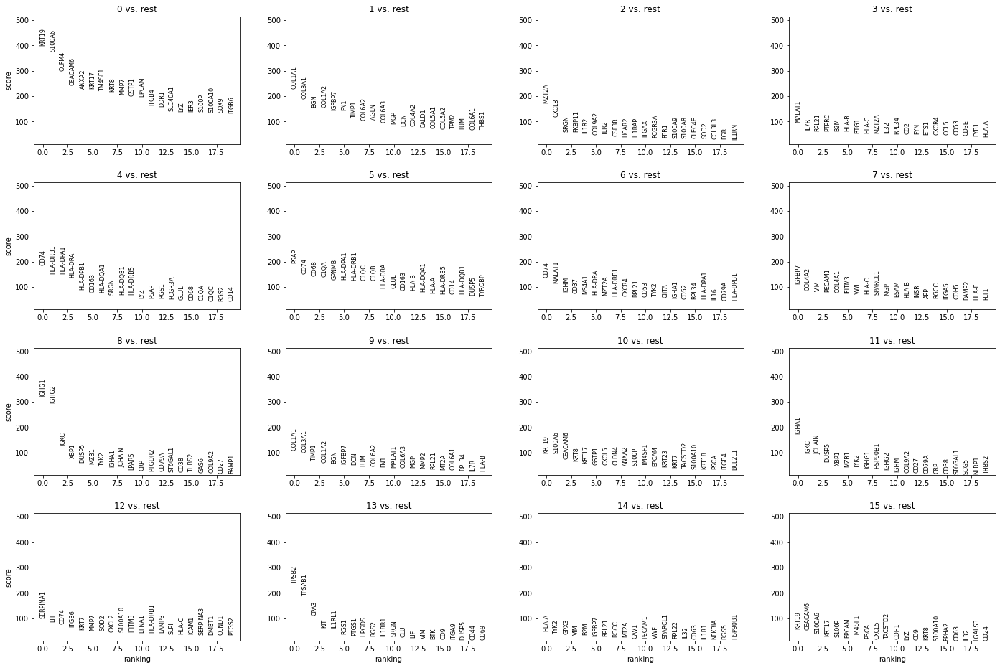

In [12]:
sc.pl.rank_genes_groups(adata)

## Plot the image with the Leiden clusters

### Plot segmentation masks for all the fields of view

Plot segmentation masks using [`squidpy.pl.spatial_segment`](https://squidpy.readthedocs.io/en/latest/api/squidpy.pl.spatial_segment.html). Specifically, the key `library_id` in `adata.obs` contains the same unique values contained in `adata.uns`. 30 spatial datasets can be visualized with `squidpy.pl.spatial_segment`. The `"cell_ID"` column is used to spot individual cells. Here, the images were colored in accordance with the intensity of the maximum pan-cytokeratin (CK) staining.

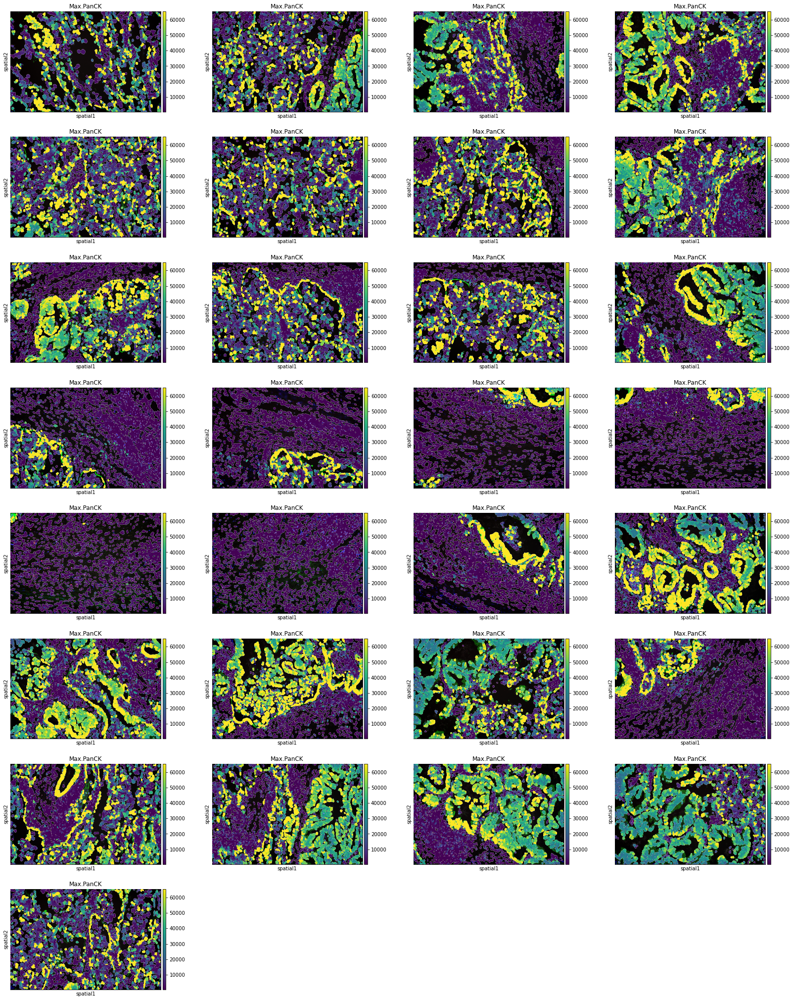

In [13]:
sq.pl.spatial_segment(
    adata,
    color="Max.PanCK",
    library_key="fov",
    seg_cell_id="cell_ID",
)

### Plot segmentation masks for only select fields of view

The argument `library_id` can also be altered to obtain specific field(s) of view.

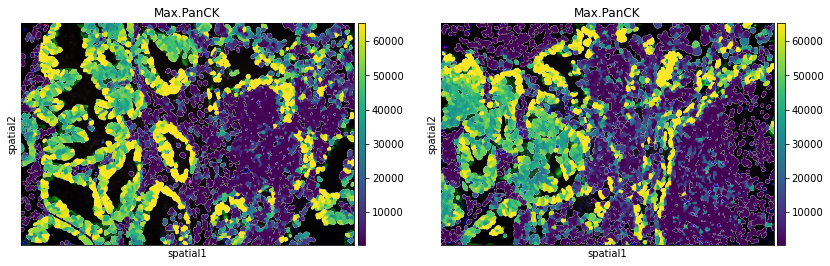

In [14]:
sq.pl.spatial_segment(
    adata,
    color="Max.PanCK",
    library_key="fov",
    library_id=["12", "16"],
    seg_cell_id="cell_ID",
)

### Plot segmentation masks for specifically cropped co-ordinates of a field of view

There are several parameters that can be controlled. For instance, it is possible to plot segmentation masks as "contours", in order to visualize the underlying image.
The co-ordinates of the FOV can be specified using the argument `crop_coord`, to get the view of required section.

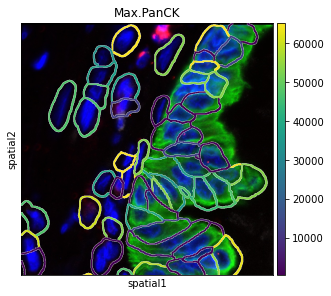

In [15]:
sq.pl.spatial_segment(
    adata,
    color="Max.PanCK",
    library_key="fov",
    library_id="12",
    seg_cell_id="cell_ID",
    seg_contourpx=10,
    crop_coord=[(0, 0, 700, 700)],
)

### Plot segmentation masks with other arguments specified

If groups of observations are plotted (as above), it\'s possible to modify whether to "visualize" the segmentation masks that do not belong to any selected group. It is set as \"transparent\" by default (see above) but in cases where e.g. no image is present it can be useful to visualize them nonetheless.

A scale bar can also be added, where size and pixel units must be passed. The size for this example are not real values and are purely for visualization purposes.

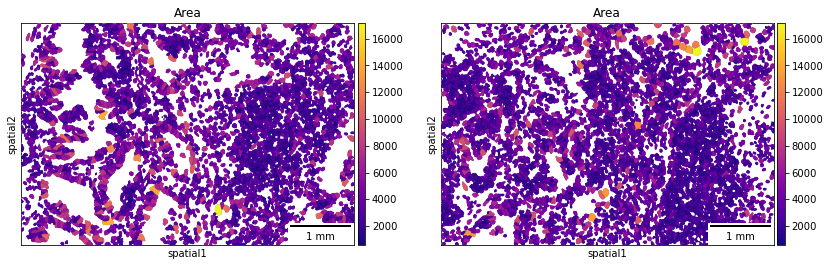

In [16]:
sq.pl.spatial_segment(
    adata,
    color="Area",
    library_key="fov",
    library_id=["12", "16"],
    seg_cell_id="cell_ID",
    seg_outline=True,
    cmap="plasma",
    img=False,
    scalebar_dx=1.0,
    scalebar_kwargs={"scale_loc": "bottom", "location": "lower right"},
)

### Plot the images with an overlay of the genes expressed

Plot the image, with an overlay of the expressed genes which were colored in consonance with the Leiden clusters. Use [`squidpy.pl.spatial_segment`](https://squidpy.readthedocs.io/en/latest/api/squidpy.pl.spatial_segment.html) for the same. The image is not visualized by specifying `img=False`.

One or multiple groups can also be used to overlay, by specifying the `groups` argument in [`squidpy.pl.spatial_segment`](https://squidpy.readthedocs.io/en/stable/api/squidpy.pl.spatial_segment.html#squidpy.pl.spatial_segment) as shown in the second subplot. The Leiden clusters can also be annotated by replacing the default numbers, according to the data as shown [here](https://github.com/theislab/squidpy_reproducibility/blob/master/notebooks/prepare_data/visium_hne.ipynb).

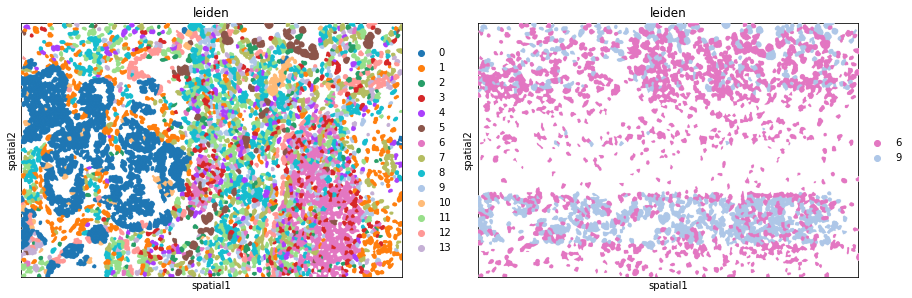

In [17]:
fig, ax = plt.subplots(1, 2, figsize=(15, 7))
sq.pl.spatial_segment(
    adata,
    shape="hex",
    color="leiden",
    library_id="16",
    library_key="fov",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    ax=ax[0],
)

sq.pl.spatial_segment(
    adata,
    color="leiden",
    seg_cell_id="cell_ID",
    groups=["6", "9"],
    library_key="fov",
    library_id="16",
    img=False,
    size=60,
    ax=ax[1],
)

----

# Computation of spatial statistics

## Building the spatial neighbors graphs

Spatial graph is a graph of spatial neighbors with observations as nodes and neighborhood relations between observations as edges. We use spatial coordinates of spots/cells to identify neighbors among them. Different approaches of defining a neighborhood relation among observations are used for different types of spatial datasets. We use [`squidpy.gr.spatial_neighbors`](https://squidpy.readthedocs.io/en/latest/api/squidpy.gr.spatial_neighbors.html#squidpy.gr.spatial_neighbors) to compute the spatial neighbors graph. We use this function for a non-grid dataset with `coord_type = 'generic'`.

Depending on the `coord_type`, `n_neighs` specifies the number of neighboring tiles if `coord_type='grid'` and when the `coord_type` is not a grid, `n_neighs` represents the number of neighborhoods. Moreover, `radius` is only available when `coord_type='generic'`.

Alternatively, `delaunay = True` can be used, for a Delaunay triangulation graph. This way, we can observe the difference in using K-nearest neighbors and Delaunay triangulation. You can appreciate that the neighbor graph is different than before.

/opt/homebrew/Caskroom/miniforge/base/envs/squidpy_3_9/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/opt/homebrew/Caskroom/miniforge/base/envs/squidpy_3_9/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


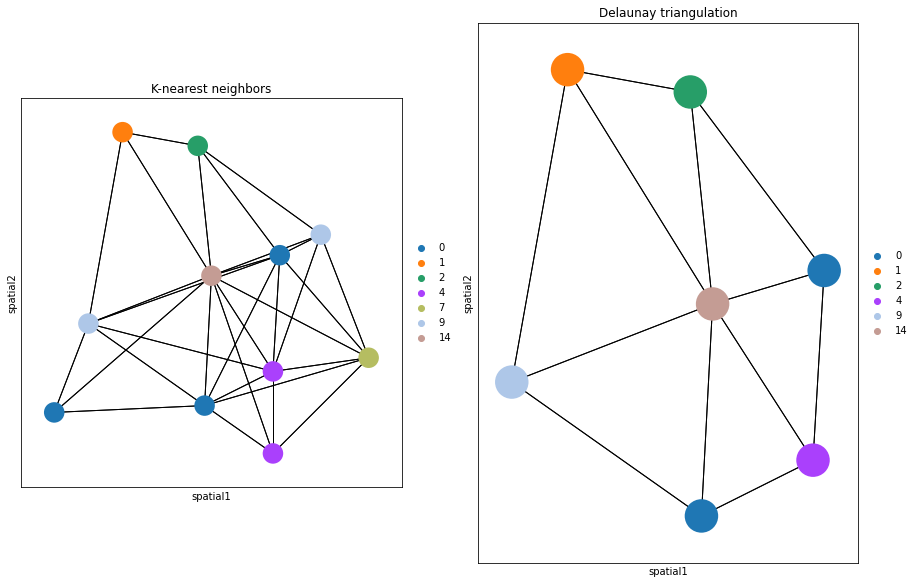

In [18]:
fig, ax = plt.subplots(1, 2, figsize=(15, 15))
sq.gr.spatial_neighbors(
    adata,
    n_neighs=10,
    coord_type="generic",
)
_, idx = adata.obsp["spatial_connectivities"][420, :].nonzero()
idx = np.append(idx, 420)
sq.pl.spatial_scatter(
    adata[idx, :],
    library_id="16",
    color="leiden",
    connectivity_key="spatial_connectivities",
    size=3,
    edges_width=1,
    edges_color="black",
    img=False,
    title="K-nearest neighbors",
    ax=ax[0],
)

sq.gr.spatial_neighbors(
    adata,
    n_neighs=10,
    coord_type="generic",
    delaunay=True,
)
_, idx = adata.obsp["spatial_connectivities"][420, :].nonzero()
idx = np.append(idx, 420)
sq.pl.spatial_scatter(
    adata[idx, :],
    library_id="16",
    color="leiden",
    connectivity_key="spatial_connectivities",
    size=3,
    edges_width=1,
    edges_color="black",
    img=False,
    title="Delaunay triangulation",
    ax=ax[1],
)

The function builds a spatial graph and saves its adjacency matrix to `adata.obsp['spatial_connectivities']` and weighted adjacency matrix to `adata.obsp['spatial_distances']` by default. Note that it can also build a graph from a square grid, just set `n_neighs = 4`.

In [19]:
adata.obsp["spatial_connectivities"]

<89246x89246 sparse matrix of type '<class 'numpy.float64'>'
	with 534344 stored elements in Compressed Sparse Row format>

In [20]:
adata.obsp["spatial_distances"]

<89246x89246 sparse matrix of type '<class 'numpy.float64'>'
	with 534344 stored elements in Compressed Sparse Row format>

The parameter `library_key` can also be specified in [`squidpy.gr.spatial_neighbors`](https://squidpy.readthedocs.io/en/latest/api/squidpy.gr.spatial_neighbors.html#squidpy.gr.spatial_neighbors). This indicates that the spatial graph is computed for each slide separately.

/opt/homebrew/Caskroom/miniforge/base/envs/squidpy_3_9/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


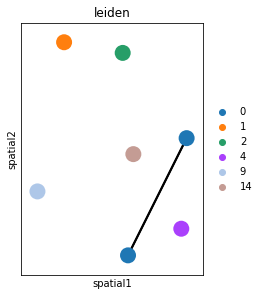

In [21]:
sq.gr.spatial_neighbors(
    adata,
    coord_type="generic",
    library_key="fov",
    n_neighs=10,
    delaunay=True,
)
sq.pl.spatial_scatter(
    adata[idx, :],
    library_id="16",
    color="leiden",
    connectivity_key="spatial_connectivities",
    size=3,
    edges_color="black",
    edges_width=2,
    img=False,
)

In order to get all spots within a specified radius (in units of the spatial coordinates) from each spot as neighbors, the parameter `radius` should be used.

In [22]:
sq.gr.spatial_neighbors(adata, radius=0.3, coord_type="generic")

adata.obsp["spatial_connectivities"]
adata.obsp["spatial_distances"]

<89246x89246 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>

----

## Compute centrality scores

This example shows how to compute centrality scores, given a spatial graph and cell type annotation.

The scores calculated are closeness centrality, degree centrality and clustering coefficient with the following properties:
* closeness centrality - measure of how close the group is to other nodes.
* clustering coefficient - measure of the degree to which nodes cluster together.
* degree centrality - fraction of non-group members connected to group members.

All scores are descriptive statistics of the spatial graph.

This dataset contains Leiden cluster groups' annotations in [`anndata.AnnData.obs`](https://anndata.readthedocs.io/en/refpaths/anndata.AnnData.obs.html#anndata.AnnData.obs), which are used for calculation of centrality scores.

First, we need to compute a connectivity matrix from spatial coordinates to calculate the centrality scores. We can use [`squidpy.gr.spatial_neighbors`](https://squidpy.readthedocs.io/en/latest/api/squidpy.gr.spatial_neighbors.html) for this purpose.

In [23]:
adata_spatial_neighbor = sq.gr.spatial_neighbors(adata)

Centrality scores are calculated with [`squidpy.gr.centrality_scores`](https://squidpy.readthedocs.io/en/stable/api/squidpy.gr.centrality_scores.html#squidpy.gr.centrality_scores), with the Leiden clusters.

In [24]:
sq.gr.centrality_scores(adata, cluster_key="leiden")

The results were visualized by plotting the average centrality, closeness centrality, and degree centrality using [`squidpy.pl.centrality_scores`](https://squidpy.readthedocs.io/en/stable/api/squidpy.pl.centrality_scores.html#squidpy.pl.centrality_scores).

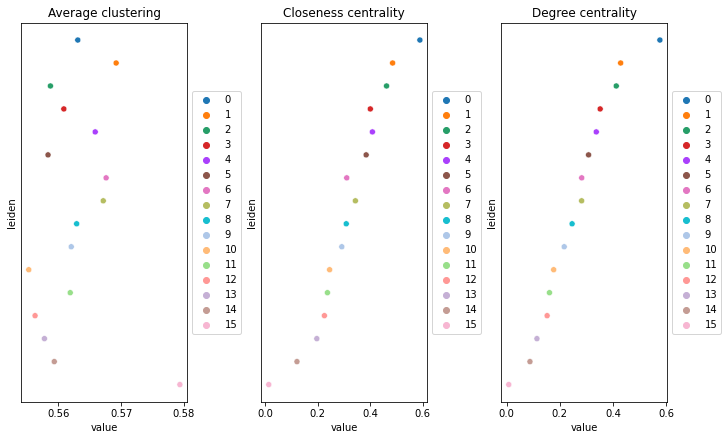

In [25]:
sq.pl.centrality_scores(adata, cluster_key="leiden", figsize=(10, 6))

----

## Compute co-occurrence probability

This example shows how to compute the co-occurrence probability.

The co-occurrence score is defined as:

$$\frac{p(exp|cond)}{p(exp)}$$
where $p(exp|cond)$ is the conditional probability of observing a
cluster $exp$ conditioned on the presence of a cluster $cond$, whereas
$p(exp)$ is the probability of observing $exp$ in the radius size of
interest. The score is computed across increasing radii size around each
cell in the tissue.

We can compute the co-occurrence score with [`squidpy.gr.co_occurrence`](https://squidpy.readthedocs.io/en/stable/api/squidpy.gr.co_occurrence.html#squidpy.gr.co_occurrence).
Results of co-occurrence probability ratio can be visualized with [`squidpy.pl.co_occurrence`](https://squidpy.readthedocs.io/en/stable/api/squidpy.pl.co_occurrence.html#squidpy.pl.co_occurrence). The '3' in the $\frac{p(exp|cond)}{p(exp)}$ represents a Leiden clustered group.

In [26]:
adata_subset = adata[adata.obs.fov == "16"].copy()

We can further visualize tissue organization in spatial coordinates with [`squidpy.pl.spatial_segment`](https://squidpy.readthedocs.io/en/latest/api/squidpy.pl.spatial_segment.html),with an overlay of the expressed genes which were colored in consonance with the Leiden clusters.

100%|██████████| 1/1 [00:06<00:00,  6.50s/]


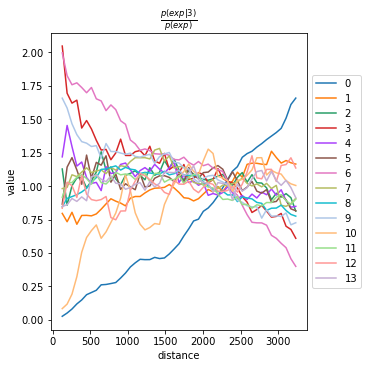

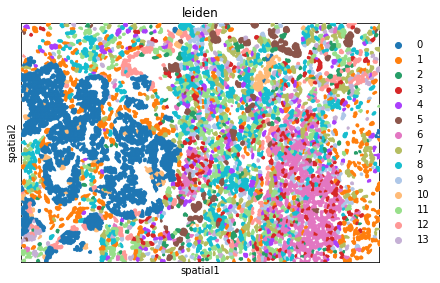

In [27]:
sq.gr.co_occurrence(
    adata_subset,
    cluster_key="leiden",
)
sq.pl.co_occurrence(
    adata_subset,
    cluster_key="leiden",
    clusters="3",
)


sq.pl.spatial_segment(
    adata_subset,
    shape="hex",
    color="leiden",
    library_id="16",
    library_key="fov",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
)

----

## Neighbors enrichment analysis

This example shows how to run the neighbors enrichment analysis routine.

It calculates an enrichment score based on proximity on the connectivity graph of cell clusters. The number of observed events is compared against $N$ permutations and a *z-score* is computed.


This dataset contains cell type annotations in [`anndata.Anndata.obs`](https://anndata.readthedocs.io/en/refpaths/anndata.AnnData.obs.html) which are used for calculation of the neighborhood enrichment. We calculate the neighborhood enrichment score with [`squidpy.gr.nhood_enrichment`](https://squidpy.readthedocs.io/en/stable/api/squidpy.gr.nhood_enrichment.html#squidpy.gr.nhood_enrichment).

In [28]:
sq.gr.nhood_enrichment(adata, cluster_key="leiden")

100%|██████████| 1000/1000 [00:10<00:00, 93.30/s]


The same can be done for a specific FOV, by creating a subset of the [`anndata.AnnData`](https://anndata.readthedocs.io/en/latest/generated/anndata.AnnData.html).

In [29]:
sq.gr.nhood_enrichment(adata_subset, cluster_key="leiden")

100%|██████████| 1000/1000 [00:03<00:00, 258.94/s]


And visualize the results with [`squidpy.pl.nhood_enrichment`](https://squidpy.readthedocs.io/en/stable/api/squidpy.pl.nhood_enrichment.html#squidpy.pl.nhood_enrichment).

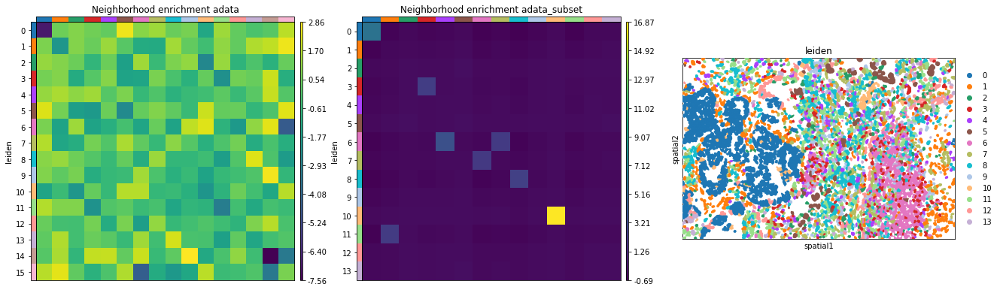

In [30]:
fig, ax = plt.subplots(1, 3, figsize=(22, 22))
sq.pl.nhood_enrichment(
    adata,
    cluster_key="leiden",
    figsize=(3, 3),
    ax=ax[0],
    title="Neighborhood enrichment adata",
)
sq.pl.nhood_enrichment(
    adata_subset,
    cluster_key="leiden",
    figsize=(3, 3),
    ax=ax[1],
    title="Neighborhood enrichment adata_subset",
)
sq.pl.spatial_segment(
    adata_subset,
    shape="hex",
    color="leiden",
    library_id="16",
    library_key="fov",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    ax=ax[2],
)

----

## Compute Ripley's statistics

This example shows how to compute the Ripley's L function.

The Ripley's L function is a descriptive statistics generally used to determine whether points have a random, dispersed or clustered distribution pattern at certain scale. The Ripley's L is a variance-normalized version of the Ripley's K statistic. There are also 2 other Ripley's statistics available (that are closely related): 'G' and 'F'.

Ripley's G monitors the portion of points for which the nearest neighbor is within a given distance threshold, and plots that cumulative percentage against the increasing distance radii.

For increasing separation range, Ripley's F function assembles the percentage of points which can be found in the aforementioned range from an arbitrary point pattern spawned in the expanse of the noticed pattern. 

We can compute the Ripley's L function with [`squidpy.gr.ripley`](https://squidpy.readthedocs.io/en/stable/api/squidpy.gr.ripley.html#squidpy.gr.ripley).
Results can be visualized with [`squidpy.pl.ripley`](https://squidpy.readthedocs.io/en/stable/api/squidpy.pl.ripley.html#squidpy.pl.ripley). The same was also plotted for `adata_subset` in the second subplot. The other Ripley's statistics can be specified using `mode = 'G'` or `mode = 'F'`.

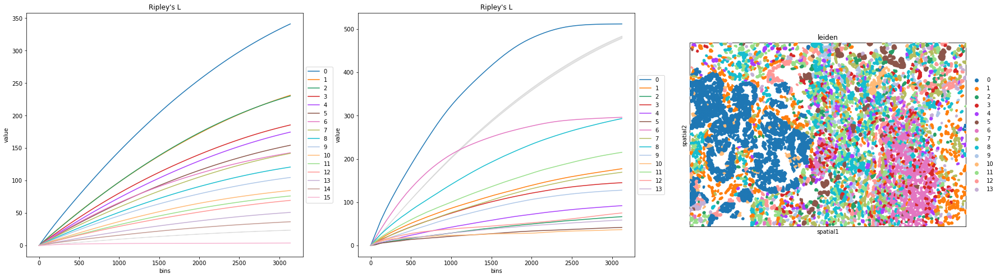

In [31]:
mode = "L"
fig, ax = plt.subplots(1, 3, figsize=(30, 8))
sq.gr.ripley(adata, cluster_key="leiden", mode=mode)
sq.pl.ripley(
    adata,
    cluster_key="leiden",
    mode=mode,
    ax=ax[0],
)

sq.gr.ripley(adata_subset, cluster_key="leiden", mode=mode)
sq.pl.ripley(
    adata_subset,
    cluster_key="leiden",
    mode=mode,
    ax=ax[1],
)

sq.pl.spatial_segment(
    adata_subset,
    shape="hex",
    color="leiden",
    library_id="16",
    library_key="fov",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    ax=ax[2],
)

----

## Compute Moran's I score

This example shows how to compute the Moran's I global spatial auto-correlation statistics.

The Moran's I global spatial auto-correlation statistics evaluates whether features (i.e. genes) shows a pattern that is clustered, dispersed or random in the tissue are under consideration.

We can compute the Moran's I score with [`squidpy.gr.spatial_autocorr`](https://squidpy.readthedocs.io/en/stable/api/squidpy.gr.spatial_autocorr.html#squidpy.gr.spatial_autocorr) and `mode = 'moran'`. We first need to compute a spatial graph with [`squidpy.gr.spatial_neighbors`](https://squidpy.readthedocs.io/en/stable/api/squidpy.gr.spatial_neighbors.html#squidpy.gr.spatial_neighbors). We will also subset the number of genes to evaluate.

In [32]:
sq.gr.spatial_neighbors(adata_subset, coord_type="generic", delaunay=True)
sq.gr.spatial_autocorr(
    adata_subset,
    mode="moran",
    n_perms=100,
    n_jobs=1,
)
adata_subset.uns["moranI"].head(10)

100%|██████████| 100/100 [04:54<00:00,  2.95s/]


,I,pval_norm,var_norm,pval_z_sim,pval_sim,var_sim,pval_norm_fdr_bh,pval_z_sim_fdr_bh,pval_sim_fdr_bh
KRT19,0.774879,0.0,0.000076,0.0,0.009901,0.000149,0.0,0.0,0.018988
OLFM4,0.752305,0.0,0.000076,0.0,0.009901,0.000144,0.0,0.0,0.018988
CEACAM6,0.749981,0.0,0.000076,0.0,0.009901,0.000178,0.0,0.0,0.018988
KRT17,0.665890,0.0,0.000076,0.0,0.009901,0.000181,0.0,0.0,0.018988
S100A6,0.624956,0.0,0.000076,0.0,0.009901,0.000140,0.0,0.0,0.018988
TM4SF1,0.586031,0.0,0.000076,0.0,0.009901,0.000153,0.0,0.0,0.018988
EPCAM,0.556131,0.0,0.000076,0.0,0.009901,0.000123,0.0,0.0,0.018988
KRT8,0.528026,0.0,0.000076,0.0,0.009901,0.000138,0.0,0.0,0.018988
ANXA2,0.511835,0.0,0.000076,0.0,0.009901,0.000119,0.0,0.0,0.018988
PIGR,0.498941,0.0,0.000076,0.0,0.009901,0.000126,0.0,0.0,0.018988


We can visualize some of those genes with [`squidpy.pl.spatial_segment`](https://squidpy.readthedocs.io/en/latest/api/squidpy.pl.spatial_segment.html). We could also pass `mode = 'geary'` to compute a closely related auto-correlation statistic, [Geary's C](https://en.wikipedia.org/wiki/Geary%27s_C). See [`squidpy.gr.spatial_autocorr`](https://squidpy.readthedocs.io/en/stable/api/squidpy.gr.spatial_autocorr.html#squidpy.gr.spatial_autocorr) for more information.

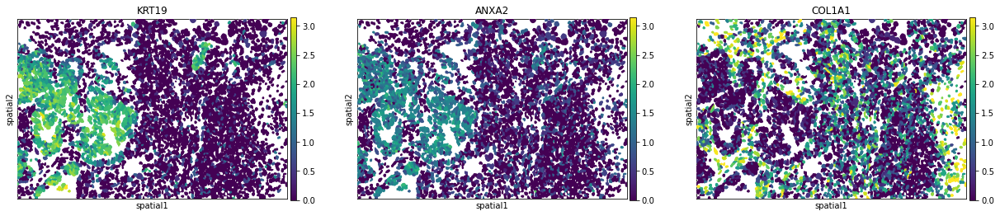

In [33]:
sq.pl.spatial_segment(
    adata_subset,
    library_id="16",
    seg_cell_id="cell_ID",
    library_key="fov",
    color=["KRT19", "ANXA2", "COL1A1"],
    size=60,
    img=False,
)

----